###  ADDIS ABABA UNIVERSITY 
    
###  ADDIS ABABA INSTITUTE OF TECHNOLOGY
    
####  SCHOOL OF INFORMATION TECHNOLOGY AND ENGINEERING – SITE
    
####  Department of Artificial Intelligence                                           



### Course Project
>>###### Course:  Computer Vision and Deep Learning 
>>###### Name:    Mintesnot Fikir, Ermias Alemayehu, and Migbare Abera
>>###### Section: Regular 
>>###### IDs:      
>>###### Submitted to: Fantahun B. (PhD)

<a name="99"></a>
### Outline
[1. Brain Tumor Detection ](#1)
- [1.1. Modelling](#1.1)


## Importing Essential Libraries for Machine Learning and Computer Vision Tasks"

In [1]:
# General-Purpose Libraries
import numpy as np
import cv2
import os
import shutil
import itertools

# Data Preprocessing and Evaluation Libraries
from sklearn.utils import shuffle
import imutils
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# Plotting and Visualization Libraries
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

# Deep Learning Libraries
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping



import os
import shutil
from sklearn.model_selection import train_test_split

# Datasets

###### Brain Tumor Dataset: 
This dataset, titled "Brain Tumor Dataset: Detection and Classification," is a widely recognized and frequently utilized resource in the field of medical imaging. It aims to facilitate the development of automated systems for brain tumor detection and classification tasks, enabling accurate diagnoses and treatment planning.

###### Dataset Overview

Brain tumors are highly aggressive diseases affecting individuals of all age groups. They account for a significant proportion of primary Central Nervous System (CNS) tumors, with thousands of new cases diagnosed each year. The survival rates for brain tumor patients are relatively low, highlighting the critical need for precise diagnostics and effective treatment strategies.

The preferred imaging modality for brain tumor detection is Magnetic Resonance Imaging (MRI). However, manual examination of MRI scans can be time-consuming and prone to errors due to the complexity of brain tumors and their diverse characteristics. To address these challenges, the dataset provides a collection of brain MRI images along with corresponding tumor annotations.


This dataset offers a valuable resource for researchers and developers interested in advancing brain tumor detection and classification through the application of machine learning and deep learning techniques. By leveraging Convolutional Neural Networks (CNNs) and Transfer Learning (TL), these advanced algorithms can automatically analyze brain MRI images, leading to more accurate and efficient tumor identification.

###### Dataset Description

The dataset consists of two main folders: "yes," "no," containing a total of 3000 Brain MRI Images.

- The "yes" folder contains 1500 brain MRI images depicting cases with tumorous brain tumors.
- The "no" folder contains 1500 brain MRI images representing cases without tumorous brain tumors.




## Brain Tumor Dataset Importing and Splitting

This section of the notebook focuses on importing the brain tumor dataset and splitting it into train, validation, and test sets. The dataset consists of two classes: "Yes" indicating the presence of a tumor and "No" indicating the absence of a tumor. The code performs the following steps:

1. Import the necessary libraries for dataset manipulation and splitting.
2. Define the paths and parameters required for dataset handling.
3. Create the necessary directories for storing the train, validation, and test sets.
4. Split the dataset by iterating over the classes and performing a train-test split.
5. Further split the test set into validation and final test sets using a ratio of 50%.
6. Copy the images into their respective directories based on the split.

This section prepares the dataset for subsequent steps such as data preprocessing, data augmentation, and model training.


In [3]:
# Define paths and parameters
IMG_PATH = 'tumor_dataset/raw/'
TRAIN_PATH = 'tumor_dataset/TRAIN/'
VAL_PATH = 'tumor_dataset/VAL/'
TEST_PATH = 'tumor_dataset/TEST/'
TEST_RATIO = 0.2  # Ratio of test data

In [4]:
# Create train/val/test directories
os.makedirs(TRAIN_PATH, exist_ok=True)
os.makedirs(VAL_PATH, exist_ok=True)
os.makedirs(TEST_PATH, exist_ok=True)

#### Split the data by train/val/test

In [5]:
# Split the data by train/val/test
for CLASS in os.listdir(IMG_PATH):
    class_path = os.path.join(IMG_PATH, CLASS)
    if os.path.isdir(class_path):
        
        # Create class directories within train/val/test
        os.makedirs(os.path.join(TRAIN_PATH, CLASS.upper()), exist_ok=True)
        os.makedirs(os.path.join(VAL_PATH, CLASS.upper()), exist_ok=True)
        os.makedirs(os.path.join(TEST_PATH, CLASS.upper()), exist_ok=True)

        images = os.listdir(class_path)
        train_images, test_images = train_test_split(images, test_size=TEST_RATIO, random_state=42)
        val_images, test_images = train_test_split(test_images, test_size=0.5, random_state=42)

        for image in train_images:
            src_path = os.path.join(class_path, image)
            dst_path = os.path.join(TRAIN_PATH, CLASS.upper(), image)
            shutil.copy(src_path, dst_path)

        for image in val_images:
            src_path = os.path.join(class_path, image)
            dst_path = os.path.join(VAL_PATH, CLASS.upper(), image)
            shutil.copy(src_path, dst_path)

        for image in test_images:
            src_path = os.path.join(class_path, image)
            dst_path = os.path.join(TEST_PATH, CLASS.upper(), image)
            shutil.copy(src_path, dst_path)


#### Define function to load the image data into workspace

In [6]:
import cv2
import os
import numpy as np

def load_data(dir_path, img_size=(100, 100)):
    """
    Load resized images as numpy arrays to workspace.

    Args:
        dir_path (str): Path to the directory containing the image data.
        img_size (tuple, optional): Size to resize the images. Defaults to (100, 100).

    Returns:
        numpy.ndarray: Array of images.
        numpy.ndarray: Array of labels.

    """
    images = []  # Array to store the loaded images
    labels = []  # Array to store the corresponding labels

    # Iterate over the class directories
    for class_name in sorted(os.listdir(dir_path)):
        class_dir = os.path.join(dir_path, class_name)
        if os.path.isdir(class_dir):
            # Iterate over the images in each class directory
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                images.append(img)
                if class_name == 'NO':
                    labels.append(0)
                else:
                    labels.append(1)

    # Convert the image and label arrays to numpy arrays
    images = np.array(images)
    labels = np.array(labels)

    print(f'{len(images)} images loaded from {dir_path} directory.')
    return images, labels

In [7]:
BASE_DIR = 'tumor_dataset/'
TRAIN_DIR = BASE_DIR + 'TRAIN/'
TEST_DIR = BASE_DIR + 'TEST/'
VAL_DIR = BASE_DIR + 'VAL/'
IMG_SIZE = (224, 224)

# Load the image data into workspace
X_train, y_train = load_data(TRAIN_DIR, img_size=IMG_SIZE)
X_val, y_val = load_data(VAL_DIR, img_size=IMG_SIZE)
X_test, y_test = load_data(TEST_DIR, img_size=IMG_SIZE)

C:\Users\Mifa\AppData\Local\Temp\ipykernel_17612\1766877271.py:36: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



293 images loaded from tumor_dataset/TRAIN/ directory.
36 images loaded from tumor_dataset/VAL/ directory.
38 images loaded from tumor_dataset/TEST/ directory.


#### Visualization of Brain Tumor Images dataset in Training Set
Lets generates a grid-like visualization of brain tumor images from the training set. Each image is displayed with its corresponding label, indicating the presence or absence of a tumor. The plot provides a concise overview of the training dataset for easy inspection.

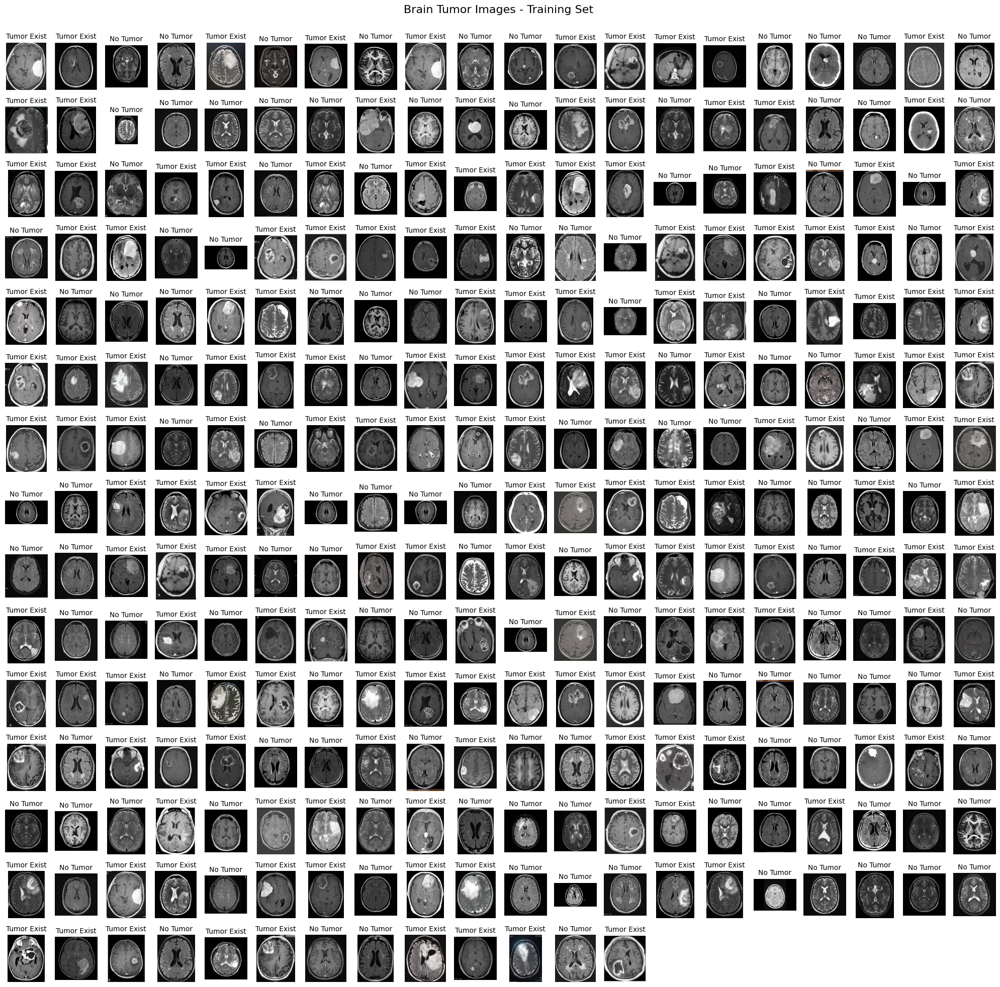

In [8]:
import matplotlib.pyplot as plt
import random

# Determine the number of rows and columns for the grid
num_rows = (len(X_train) - 1) // 20 + 1
num_cols = min(len(X_train), 20)

# Create a grid of subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20))

# Shuffle the training data
combined = list(zip(X_train, y_train))
random.shuffle(combined)
X_train_shuffled, y_train_shuffled = zip(*combined)

# Iterate through each image in the training set and display it with label
for i in range(len(X_train)):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].imshow(X_train_shuffled[i])
    axs[row, col].axis('off')

    # Set label based on tumor existence
    label = 'Tumor Exist' if y_train_shuffled[i] == 1 else 'No Tumor'
    axs[row, col].set_title(label, fontsize=10)

# Remove any empty subplots
if len(X_train) < num_rows * num_cols:
    for j in range(len(X_train), num_rows * num_cols):
        axs[j // num_cols, j % num_cols].remove()

# Set the title of the plot
plt.suptitle('Brain Tumor Images - Training Set \n\n', fontsize=16)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


### Visualizing the Distribution of Image Ratios in the Dataset 
#### Histogram of Ratio Distributions



Calculates the distribution of image ratios (ratio = width/height) for the given dataset. This analysis is performed to understand the variation in image sizes and aspect ratios within the dataset. The code iterates through the training, testing, and validation datasets, and for each image, it calculates the ratio of width to height. These ratios are then plotted as a histogram.

The histogram visualizes the distribution of image ratios, which provides insights into the aspect ratios of the images. The x-axis represents the ratio values, while the y-axis indicates the count of images falling within each ratio range. The histogram is divided into multiple bins to provide a detailed view of the ratio distribution. The plot helps identify the range of ratios present in the dataset and observe any skewness or patterns.

It is worth noting that the presence of different image sizes and the variation in "black corners" may cause certain wide images to appear distorted after resizing. Analyzing the ratio distribution can help understand this variation and make informed decisions regarding image preprocessing or model training.


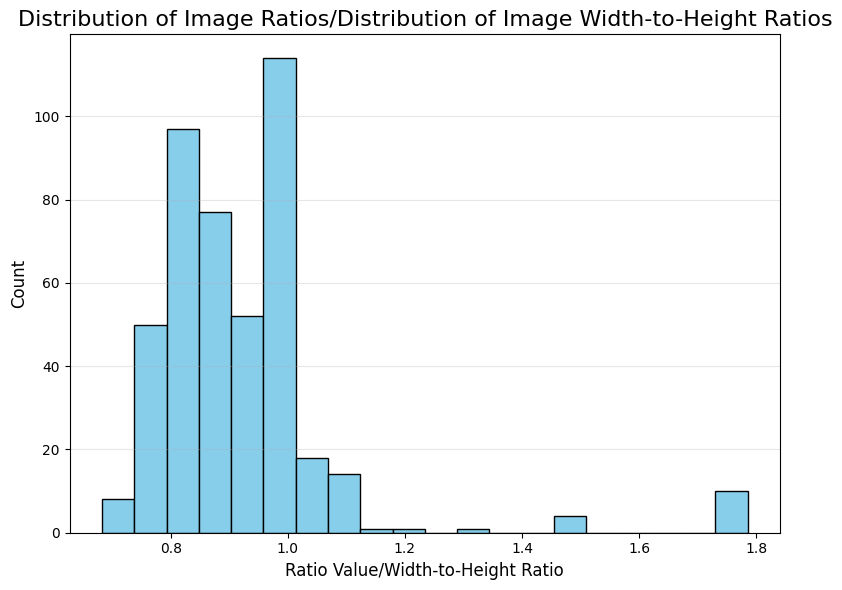

In [8]:
RATIO_LIST = []
for dataset in (X_train, X_test, X_validation):
    for img in dataset:
        ratio = img.shape[1] / img.shape[0]
        RATIO_LIST.append(ratio)

plt.figure(figsize=(8, 6))
plt.hist(RATIO_LIST, bins=20, edgecolor='black', color='skyblue')
plt.title('Distribution of Image Ratios/Distribution of Image Width-to-Height Ratios', fontsize=16)
plt.xlabel('Ratio Value/Width-to-Height Ratio', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


### Low-Level Feature Extraction

In this notebook, we perform high-level feature extraction on an image using various edge detection algorithms. The goal is to identify and highlight important edges and corners in the image, which can serve as higher-level features for further analysis or computer vision tasks.

##### First Order

We start by applying first-order edge detection algorithms on the grayscale image. These algorithms capture the local intensity gradients in different directions, revealing the presence of edges. The following algorithms are used:

- **Sobel Operator**: Computes the gradient magnitude using horizontal and vertical derivatives.
- **Prewitt Operator**: Estimates the gradient magnitude using a similar approach as the Sobel operator.
- **Roberts Cross**: Computes the gradient magnitude using the Roberts cross operator.
- **Canny Edge Detection**: Applies the Canny algorithm to detect a wide range of edges.

##### Second Order

Next, we move on to second-order edge detection algorithms, which capture more complex image structures. The following algorithms are used:

- **Laplacian Operator**: Detects edges by computing the second derivative of the image intensity.
- **Marr-Hildreth Operator**: Applies the Laplacian operator after smoothing the image with a Gaussian filter.

#### Harris Corner Detection

Finally, we demonstrate Harris corner detection, a popular method for identifying corner features in an image. By analyzing the variations in intensity around each pixel, Harris corner detection algorithm highlights points that correspond to corners.

The resulting images are displayed using matplotlib, allowing us to visualize the original image along with the detected edges and corners. The grayscale image is shown first, followed by the results of each edge detection algorithm. The Harris corner detection result is displayed separately.

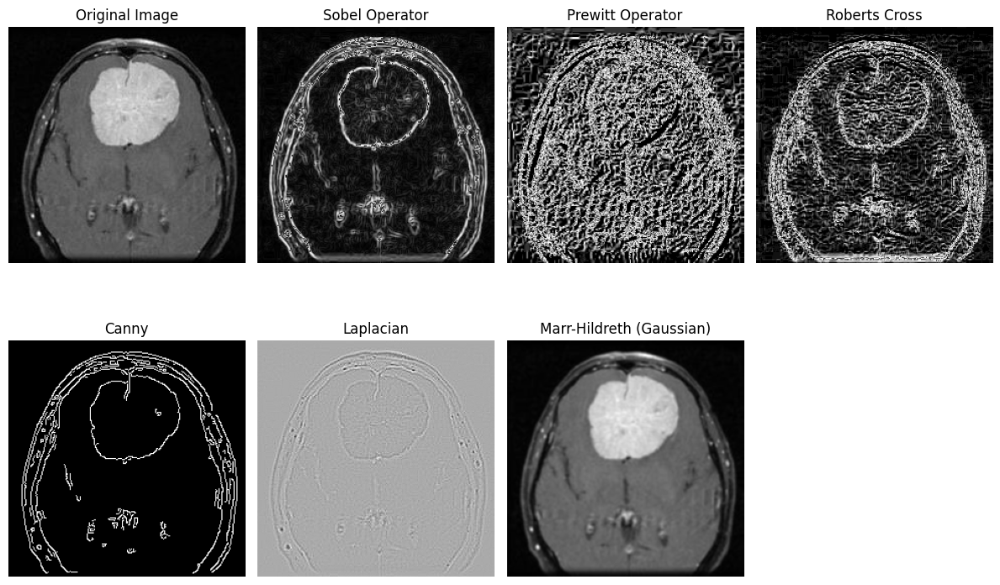

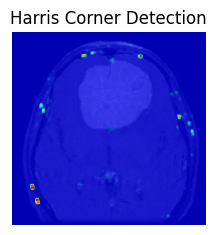

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "y1380.jpg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply first-order edge detection algorithms
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobel_x**2 + sobel_y**2).astype(np.uint8)

prewitt_x = cv2.filter2D(image, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv2.filter2D(image, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
prewitt = np.sqrt(prewitt_x**2 + prewitt_y**2).astype(np.uint8)

roberts_x = cv2.filter2D(image, -1, np.array([[1, 0], [0, -1]]))
roberts_y = cv2.filter2D(image, -1, np.array([[0, 1], [-1, 0]]))
roberts = np.sqrt(roberts_x**2 + roberts_y**2).astype(np.uint8)

canny = cv2.Canny(image, 100, 200)

# Apply second-order edge detection algorithms
laplacian = cv2.Laplacian(image, cv2.CV_64F)

kernel_size = 3
sigma = 1.0
gaussian = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
marr_hildreth = cv2.Laplacian(gaussian, cv2.CV_64F)

# Display the original image and the edges
plt.figure(figsize=(12, 8))
plt.subplot(2, 4, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(sobel, cmap='gray')
plt.title('Sobel Operator')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(prewitt, cmap='gray')
plt.title('Prewitt Operator')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(roberts, cmap='gray')
plt.title('Roberts Cross')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(canny, cmap='gray')
plt.title('Canny')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(gaussian, cmap='gray')
plt.title('Marr-Hildreth (Gaussian)')
plt.axis('off')

plt.tight_layout()
plt.show()



# Harris corner detection
plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.imshow(harris, cmap='jet', alpha=0.7)
plt.title('Harris Corner Detection')
plt.axis('off')
plt.tight_layout()
plt.show()



### High-level Feature Extraction Contour

In [ ]:
import cv2
import numpy

#Read the image and convert it to grayscale
image = cv2.imread('y1380.jpg')
image = cv2.resize(image, None, fx=0.6,fy=0.6)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#Now convert the grayscale image to binary image
ret, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#Now detect the contours
contours, hierarchy = cv2.findContours(binary, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

#Visualize the data structure
print("Length of contours {}".format(len(contours)))
print("Here is the hierarchy of detected contours :")
print(hierarchy)

# draw contours on the original image
image_copy = image.copy()
image_copy = cv2.drawContours(image_copy, contours, -1, (0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

#Visualizing the results
cv2.imshow('Grayscale Image', gray)
cv2.imshow('Drawn Contours', image_copy)
cv2.imshow('Binary Image', binary)

cv2.waitKey(0)
cv2.destroyAllWindows()

Length of contours 71
Here is the hierarchy of detected contours :
[[[ 1 -1 -1 -1]
  [ 2  0 -1 -1]
  [ 3  1 -1 -1]
  [ 4  2 -1 -1]
  [ 5  3 -1 -1]
  [ 6  4 -1 -1]
  [ 7  5 -1 -1]
  [ 8  6 -1 -1]
  [ 9  7 -1 -1]
  [10  8 -1 -1]
  [11  9 -1 -1]
  [12 10 -1 -1]
  [13 11 -1 -1]
  [14 12 -1 -1]
  [15 13 -1 -1]
  [16 14 -1 -1]
  [17 15 -1 -1]
  [18 16 -1 -1]
  [19 17 -1 -1]
  [24 18 20 -1]
  [21 -1 -1 19]
  [22 20 -1 19]
  [23 21 -1 19]
  [-1 22 -1 19]
  [25 19 -1 -1]
  [26 24 -1 -1]
  [27 25 -1 -1]
  [28 26 -1 -1]
  [29 27 -1 -1]
  [30 28 -1 -1]
  [31 29 -1 -1]
  [32 30 -1 -1]
  [33 31 -1 -1]
  [34 32 -1 -1]
  [-1 33 35 -1]
  [36 -1 -1 34]
  [37 35 -1 34]
  [38 36 -1 34]
  [39 37 -1 34]
  [40 38 -1 34]
  [41 39 -1 34]
  [42 40 -1 34]
  [44 41 43 34]
  [-1 -1 -1 42]
  [45 42 -1 34]
  [46 44 -1 34]
  [47 45 -1 34]
  [48 46 -1 34]
  [49 47 -1 34]
  [50 48 -1 34]
  [51 49 -1 34]
  [52 50 -1 34]
  [53 51 -1 34]
  [54 52 -1 34]
  [55 53 -1 34]
  [56 54 -1 34]
  [57 55 -1 34]
  [58 56 -1 34]
  [59

Length of contours: 76
(array([[[ 34, 196]],

       [[ 34, 197]]], dtype=int32), array([[[ 39, 191]],

       [[ 39, 192]]], dtype=int32), array([[[197, 181]],

       [[197, 182]],

       [[196, 183]],

       [[196, 184]],

       [[195, 185]],

       [[195, 186]],

       [[194, 187]],

       [[194, 188]],

       [[194, 189]],

       [[193, 190]],

       [[192, 191]],

       [[192, 192]],

       [[192, 193]],

       [[192, 194]],

       [[191, 195]],

       [[190, 195]],

       [[190, 196]],

       [[189, 197]],

       [[189, 198]],

       [[188, 199]],

       [[187, 200]],

       [[187, 201]],

       [[186, 202]],

       [[185, 203]],

       [[185, 204]],

       [[186, 203]],

       [[187, 202]],

       [[188, 202]],

       [[188, 201]],

       [[189, 200]],

       [[190, 199]],

       [[190, 198]],

       [[190, 197]],

       [[191, 196]],

       [[191, 195]],

       [[192, 194]],

       [[193, 193]],

       [[193, 192]],

       [[194, 191]],

  

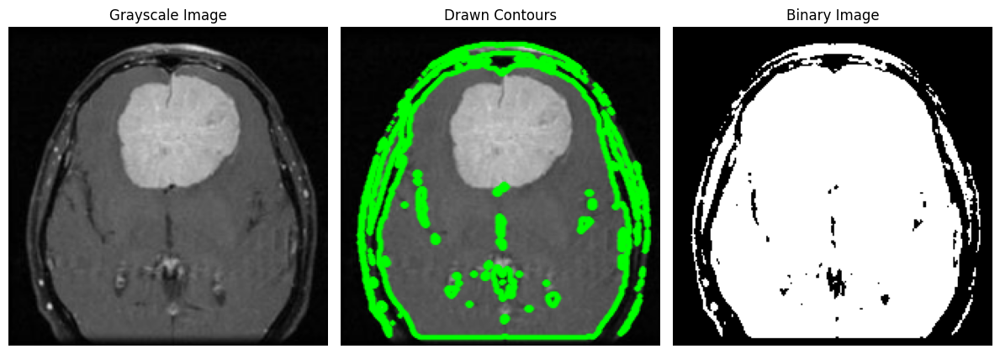

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image and convert it to grayscale
image = cv2.imread('y1380.jpg')
image = cv2.resize(image, None, fx=0.9, fy=0.9)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Convert the grayscale image to binary image
ret, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Detect the contours
contours, hierarchy = cv2.findContours(binary, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

# Visualize the data structure
print("Length of contours: {}".format(len(contours)))
print(contours)

# Draw contours on the original image
image_copy = image.copy()
image_copy = cv2.drawContours(image_copy, contours, -1, (0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

# Visualize the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))
plt.title('Drawn Contours')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(binary, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.tight_layout()
plt.show()


# Image Preprocessing: Cropping, Resizing, and Normalization

In the context of training images, it is often necessary to perform preprocessing steps to achieve consistency in size, level, and intensity. The provided code demonstrates three important steps: cropping, resizing, and normalization. Let's explore the reasons for these operations and describe each process:

## Reason for Cropping
The training images exhibit variations in size, aspect ratio, and the presence of "black corners." To ensure uniformity and eliminate unnecessary background, cropping the image is necessary. Cropping involves identifying the extreme points of the object of interest and drawing a rectangle around them. This step isolates the relevant portion of the image, removing any unwanted background or black corners.

## Description of Each Process
1. **Original Image**: The input image in its original form.
2. **Grayscale Image**: Conversion of the original image to grayscale. Grayscale images contain only shades of gray, simplifying subsequent analysis and reducing computational complexity.
3. **Binary Image**: Thresholding the grayscale image to obtain a binary image. This process converts the grayscale image into a black and white image, where pixels are classified as either black or white based on a certain threshold value.
4. **Contour-drawn Image**: Drawing contours on the original image to highlight object boundaries. Contours represent the outline of objects present in the image and provide valuable information for object detection and recognition tasks.
5. **Extreme Points Outlined**: Marking the extreme points of the object with colored dots. Extreme points indicate the outermost boundaries of the object, helping to define the region of interest.
6. **Rectangle Across Extreme Points**: Drawing a rectangle around the extreme points to define the cropping area. The rectangle encompasses the object, providing a precise boundary for cropping.
7. **Cropped Image**: Extracting the cropped region from the original image based on the defined rectangle. The cropped image contains only the object of interest, removing any unnecessary background or irrelevant content.
8. **Resized Image**: Resizing the cropped image to a fixed size of (224, 224). Resizing is particularly important when using deep learning models that require input images of specific dimensions. Resizing ensures that the image fits the required input size, maintaining the aspect ratio and avoiding distortions.
9. **Normalization**: Scaling the pixel values of the resized image to a standardized range. Normalization is crucial for bringing the pixel intensities to a common scale, enabling more stable and efficient model training. Typical normalization techniques involve dividing the pixel values by 255 to bring them within the range of [0, 1].

By following these preprocessing steps, including normalization, we achieve consistency in image size, level, and intensity, enabling more accurate analysis, detection, and recognition tasks in subsequent operations or models.


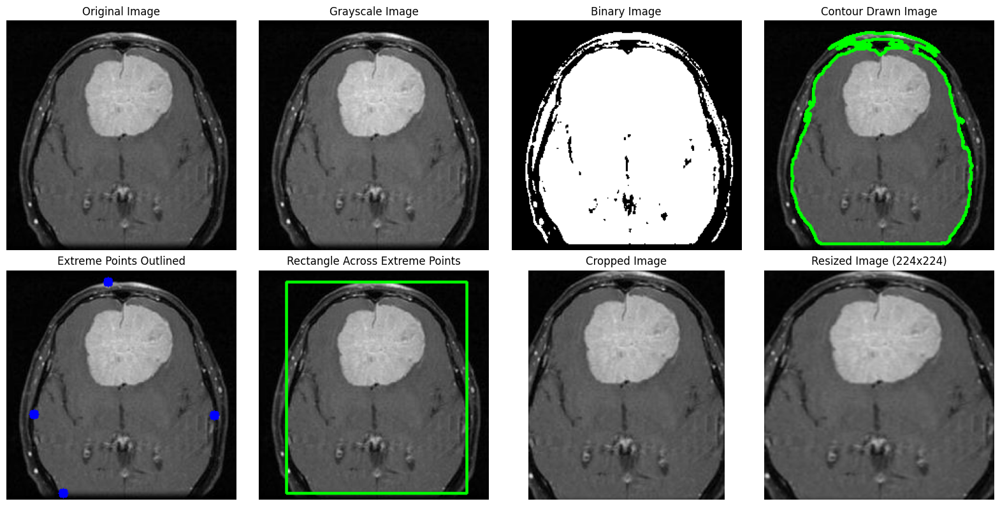

In [9]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Read the image
image_path = "y1380.jpg"
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold the grayscale image
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Find the contours in the binary image
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour
largest_contour = max(contours, key=cv2.contourArea)

# Find the extreme points of the largest contour
leftmost = tuple(largest_contour[largest_contour[:, :, 0].argmin()][0])
rightmost = tuple(largest_contour[largest_contour[:, :, 0].argmax()][0])
topmost = tuple(largest_contour[largest_contour[:, :, 1].argmin()][0])
bottommost = tuple(largest_contour[largest_contour[:, :, 1].argmax()][0])

# Draw a rectangle around the extreme points
image_copy = image.copy()
cv2.rectangle(image_copy, (leftmost[0], topmost[1]), (rightmost[0], bottommost[1]), (0, 255, 0), 2)

# Crop the image based on the extreme points
cropped_image = image[topmost[1]:bottommost[1], leftmost[0]:rightmost[0]]

# Resize the cropped image to (224, 224)
resized_image = cv2.resize(cropped_image, (224, 224))

# Create subplots to display the images
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Original image
axs[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

# Grayscale image
axs[0, 1].imshow(gray, cmap='gray')
axs[0, 1].set_title('Grayscale Image')
axs[0, 1].axis('off')

# Binary image
axs[0, 2].imshow(binary, cmap='gray')
axs[0, 2].set_title('Binary Image')
axs[0, 2].axis('off')

# Contour drawn image
contour_image = image.copy()
cv2.drawContours(contour_image, [largest_contour], -1, (0, 255, 0), 2)
axs[0, 3].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
axs[0, 3].set_title('Contour Drawn Image')
axs[0, 3].axis('off')

# Image with extreme points outlined
extreme_image = image.copy()
cv2.circle(extreme_image, leftmost, 5, (255, 0, 0), -1)
cv2.circle(extreme_image, rightmost, 5, (255, 0, 0), -1)
cv2.circle(extreme_image, topmost, 5, (255, 0, 0), -1)
cv2.circle(extreme_image, bottommost, 5, (255, 0, 0), -1)
axs[1, 0].imshow(cv2.cvtColor(extreme_image, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('Extreme Points Outlined')
axs[1, 0].axis('off')

# Image with rectangle across extreme points
rectangle_image = image.copy()
cv2.rectangle(rectangle_image, (leftmost[0], topmost[1]), (rightmost[0], bottommost[1]), (0, 255, 0), 2)
axs[1, 1].imshow(cv2.cvtColor(rectangle_image, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('Rectangle Across Extreme Points')
axs[1, 1].axis('off')

# Cropped image
axs[1, 2].imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
axs[1, 2].set_title('Cropped Image')
axs[1, 2].axis('off')

# Resized image
axs[1, 3].imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
axs[1, 3].set_title('Resized Image (224x224)')
axs[1, 3].axis('off')

plt.tight_layout()
plt.show()


### Function for Cropping and Resizing All Training Data
This function is used to crop and resize all training data to ensure consistent size and format. It takes an array of images as input and performs the following steps:

1. Detects the extreme points on each image using contour detection.
2. Crops the rectangular region based on the extreme points.
3. Resizes the cropped image to a specified size.

In [21]:
# Declaring the function for cropping training data
def crop_images(images, additional_pixels=0):
    """
    Finds the extreme points on the image and crops the rectangular region out of them.

    Args:
        images (numpy.ndarray): Array of input images to be cropped.
        additional_pixels (int, optional): Number of additional pixels to be included in the cropped region. Defaults to 0.

    Returns:
        numpy.ndarray: Array of cropped images.
    """
    cropped_images = []
    for image in images:
        # Convert image to grayscale and apply Gaussian blur
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # Threshold the image and perform erosions and dilations
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # Find contours and grab the largest one
        contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours = imutils.grab_contours(contours)
        contour = max(contours, key=cv2.contourArea)

        # Find the extreme points
        leftmost = tuple(contour[contour[:, :, 0].argmin()][0])
        rightmost = tuple(contour[contour[:, :, 0].argmax()][0])
        topmost = tuple(contour[contour[:, :, 1].argmin()][0])
        bottommost = tuple(contour[contour[:, :, 1].argmax()][0])

        # Crop the image based on extreme points
        add_pixels = additional_pixels
        cropped_image = image[topmost[1]-add_pixels:bottommost[1]+add_pixels, leftmost[0]-add_pixels:rightmost[0]+add_pixels].copy()
        cropped_images.append(cropped_image)

    return np.array(cropped_images)


In [9]:
def crop_imgs(set_name, add_pixels_value=0):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    set_new = []
    for img in set_name:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # threshold the image, then perform a series of erosions +
        # dilations to remove any small regions of noise
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # find contours in thresholded image, then grab the largest one
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        # find the extreme points
        extLeft = tuple(c[c[:, :, 0].argmin()][0])
        extRight = tuple(c[c[:, :, 0].argmax()][0])
        extTop = tuple(c[c[:, :, 1].argmin()][0])
        extBot = tuple(c[c[:, :, 1].argmax()][0])

        ADD_PIXELS = add_pixels_value
        new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
        set_new.append(new_img)

    return np.array(set_new)


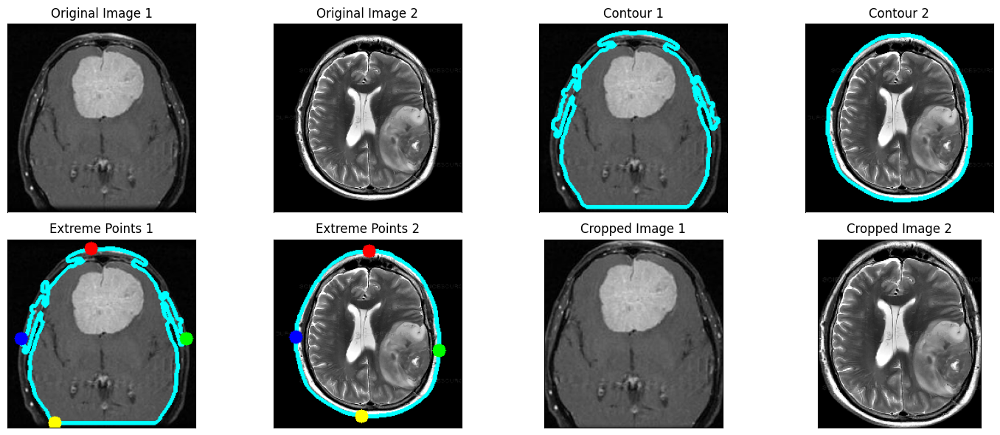

In [30]:
import cv2
import imutils
import matplotlib.pyplot as plt

# Load the images
img1 = cv2.imread('y1380.jpg')
img2 = cv2.imread('tumor_dataset/raw/yes/Y108.jpg')

# Resize the images
img1 = cv2.resize(
            img1,
            dsize=(224, 224),  # Replace with desired image size
            interpolation=cv2.INTER_CUBIC
        )
img2 = cv2.resize(
            img2,
            dsize=(224, 224),  # Replace with desired image size
            interpolation=cv2.INTER_CUBIC
        )

# Convert the images to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Apply Gaussian blur to reduce noise
gray1 = cv2.GaussianBlur(gray1, (5, 5), 0)
gray2 = cv2.GaussianBlur(gray2, (5, 5), 0)

# Threshold the images to create binary images
thresh1 = cv2.threshold(gray1, 45, 255, cv2.THRESH_BINARY)[1]
thresh2 = cv2.threshold(gray2, 45, 255, cv2.THRESH_BINARY)[1]

# Perform erosion and dilation to remove noise
thresh1 = cv2.erode(thresh1, None, iterations=2)
thresh1 = cv2.dilate(thresh1, None, iterations=2)
thresh2 = cv2.erode(thresh2, None, iterations=2)
thresh2 = cv2.dilate(thresh2, None, iterations=2)

# Find contours in the thresholded images and select the largest ones
cnts1 = cv2.findContours(thresh1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts1 = imutils.grab_contours(cnts1)
c1 = max(cnts1, key=cv2.contourArea)

cnts2 = cv2.findContours(thresh2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts2 = imutils.grab_contours(cnts2)
c2 = max(cnts2, key=cv2.contourArea)

# Find the extreme points of the contours
extLeft1 = tuple(c1[c1[:, :, 0].argmin()][0])
extRight1 = tuple(c1[c1[:, :, 0].argmax()][0])
extTop1 = tuple(c1[c1[:, :, 1].argmin()][0])
extBot1 = tuple(c1[c1[:, :, 1].argmax()][0])

extLeft2 = tuple(c2[c2[:, :, 0].argmin()][0])
extRight2 = tuple(c2[c2[:, :, 0].argmax()][0])
extTop2 = tuple(c2[c2[:, :, 1].argmin()][0])
extBot2 = tuple(c2[c2[:, :, 1].argmax()][0])

# Draw the contours on the images
img_contour1 = cv2.drawContours(img1.copy(), [c1], -1, (0, 255, 255), 4)
img_contour2 = cv2.drawContours(img2.copy(), [c2], -1, (0, 255, 255), 4)

# Draw circles at the extreme points
img_points1 = cv2.circle(img_contour1.copy(), extLeft1, 8, (0, 0, 255), -1)
img_points1 = cv2.circle(img_points1, extRight1, 8, (0, 255, 0), -1)
img_points1 = cv2.circle(img_points1, extTop1, 8, (255, 0, 0), -1)
img_points1 = cv2.circle(img_points1, extBot1, 8, (255, 255, 0), -1)

img_points2 = cv2.circle(img_contour2.copy(), extLeft2, 8, (0, 0, 255), -1)
img_points2 = cv2.circle(img_points2, extRight2, 8, (0, 255, 0), -1)
img_points2 = cv2.circle(img_points2, extTop2, 8, (255, 0, 0), -1)
img_points2 = cv2.circle(img_points2, extBot2, 8, (255, 255, 0), -1)

# Crop the images based on the extreme points
ADD_PIXELS = 0
cropped_img1 = img1[extTop1[1]-ADD_PIXELS:extBot1[1]+ADD_PIXELS, extLeft1[0]-ADD_PIXELS:extRight1[0]+ADD_PIXELS].copy()
cropped_img2 = img2[extTop2[1]-ADD_PIXELS:extBot2[1]+ADD_PIXELS, extLeft2[0]-ADD_PIXELS:extRight2[0]+ADD_PIXELS].copy()

# Display the images
plt.figure(figsize=(15, 6))
plt.subplot(2, 4, 1)
plt.imshow(img1)
plt.xticks([])
plt.yticks([])
plt.title('Original Image 1')

plt.subplot(2, 4, 2)
plt.imshow(img2)
plt.xticks([])
plt.yticks([])
plt.title('Original Image 2')

plt.subplot(2, 4, 3)
plt.imshow(img_contour1)
plt.xticks([])
plt.yticks([])
plt.title('Contour 1')

plt.subplot(2, 4, 4)
plt.imshow(img_contour2)
plt.xticks([])
plt.yticks([])
plt.title('Contour 2')

plt.subplot(2, 4, 5)
plt.imshow(img_points1)
plt.xticks([])
plt.yticks([])
plt.title('Extreme Points 1')

plt.subplot(2, 4, 6)
plt.imshow(img_points2)
plt.xticks([])
plt.yticks([])
plt.title('Extreme Points 2')

plt.subplot(2, 4, 7)
plt.imshow(cropped_img1)
plt.xticks([])
plt.yticks([])
plt.title('Cropped Image 1')

plt.subplot(2, 4, 8)
plt.imshow(cropped_img2)
plt.xticks([])
plt.yticks([])
plt.title('Cropped Image 2')

plt.tight_layout()
plt.show()


>>
>>
>>
**To apply the cropping function to the training, validation, and test sets, we can use the following code:**

In [10]:
# Apply cropping to the sets
# X_train_crop = crop_images(images=X_train)
# X_val_crop = crop_images(images=X_val)
# X_test_crop = crop_images(images=X_test)

# apply this for each set
X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

C:\Users\Mifa\AppData\Local\Temp\ipykernel_17612\2260051550.py:31: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



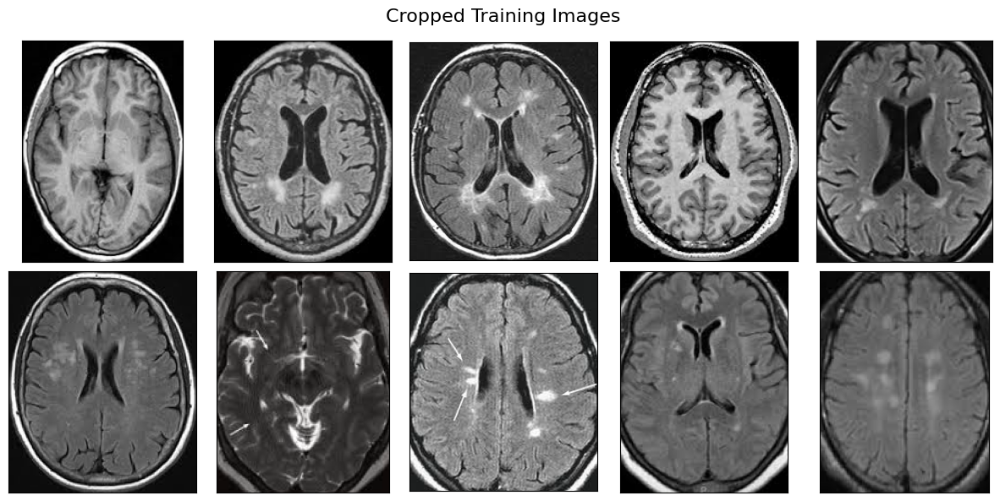

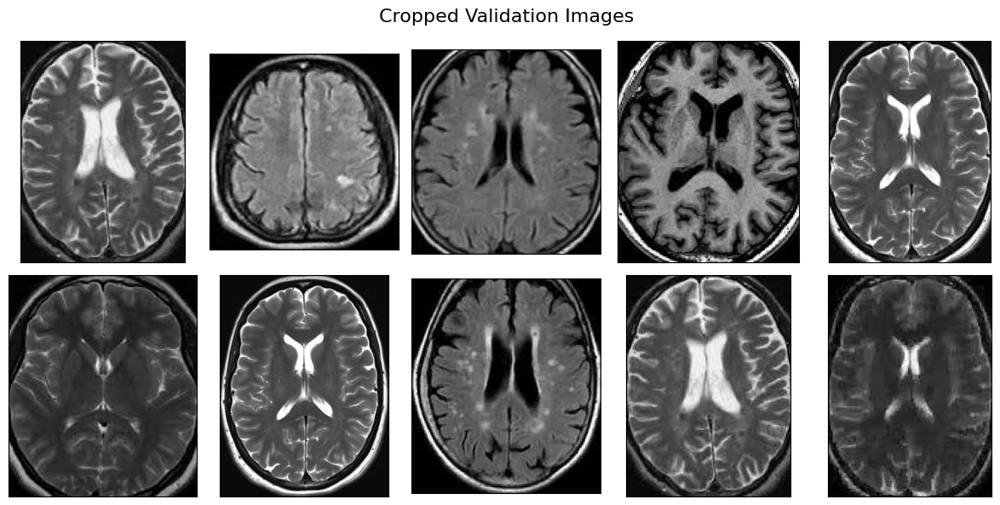

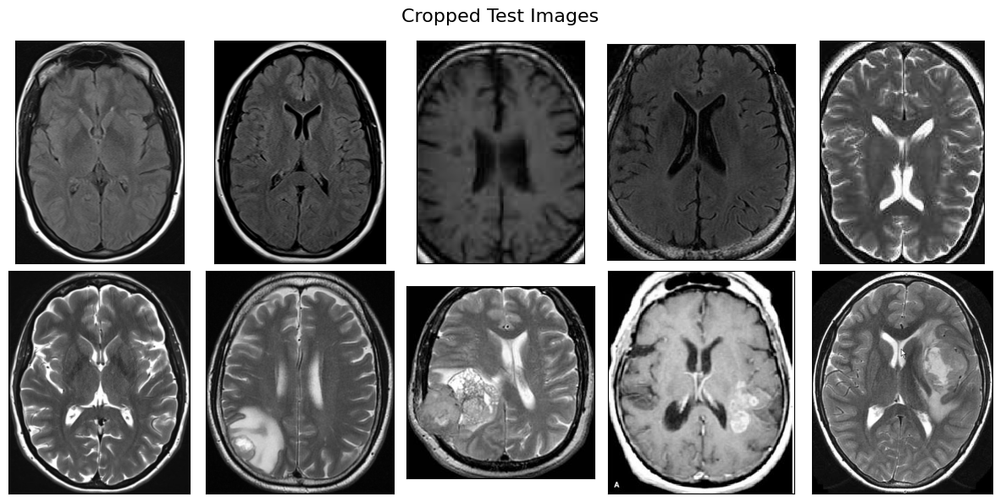

In [28]:
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, title):
    plt.figure(figsize=(12, 6))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        plt.imshow(images[i])
        plt.xticks([])
        plt.yticks([])
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Display cropped images from each dataset
display_images(X_train_crop[10:20], 'Cropped Training Images')
display_images(X_val_crop[:10], 'Cropped Validation Images')
display_images(X_test_crop[10:20], 'Cropped Test Images')


### Saving Cropped Images and Counting the Number of Images
lets save the cropped images into separate folders for each dataset (train, validation, and test). The images are saved based on their class label ("NO" or "YES") within the respective folders. Additionally, the code counts the number of images that have been cropped and saved in each dataset. This provides an overview of the dataset after cropping.

In [11]:
import cv2
import os

def save_new_images(x_set, y_set, folder_name):
    i = 0
    for (img, imclass) in zip(x_set, y_set):
        if imclass == 0:
            cv2.imwrite(os.path.join(folder_name, 'NO', f'{i}.jpg'), img)
        else:
            cv2.imwrite(os.path.join(folder_name, 'YES', f'{i}.jpg'), img)
        i += 1

# Define the folder paths
BASE_DIR = 'tumor_dataset'
TRAIN_CROP_DIR = os.path.join(BASE_DIR, 'TRAIN_CROP')
VAL_CROP_DIR = os.path.join(BASE_DIR, 'VAL_CROP')
TEST_CROP_DIR = os.path.join(BASE_DIR, 'TEST_CROP')

# Create the directories if they don't exist
os.makedirs(TRAIN_CROP_DIR, exist_ok=True)
os.makedirs(os.path.join(TRAIN_CROP_DIR, 'NO'), exist_ok=True)
os.makedirs(os.path.join(TRAIN_CROP_DIR, 'YES'), exist_ok=True)
os.makedirs(VAL_CROP_DIR, exist_ok=True)
os.makedirs(os.path.join(VAL_CROP_DIR, 'NO'), exist_ok=True)
os.makedirs(os.path.join(VAL_CROP_DIR, 'YES'), exist_ok=True)
os.makedirs(TEST_CROP_DIR, exist_ok=True)
os.makedirs(os.path.join(TEST_CROP_DIR, 'NO'), exist_ok=True)
os.makedirs(os.path.join(TEST_CROP_DIR, 'YES'), exist_ok=True)


# Saving new images to the folder
save_new_images(X_train_crop, y_train, folder_name=TRAIN_CROP_DIR)
save_new_images(X_val_crop, y_val, folder_name=VAL_CROP_DIR)
save_new_images(X_test_crop, y_test, folder_name=TEST_CROP_DIR)

# Print the number of images cropped and saved
train_cropped_count = len(os.listdir(os.path.join(TRAIN_CROP_DIR, 'NO'))) + len(os.listdir(os.path.join(TRAIN_CROP_DIR, 'YES')))
val_cropped_count = len(os.listdir(os.path.join(VAL_CROP_DIR, 'NO'))) + len(os.listdir(os.path.join(VAL_CROP_DIR, 'YES')))
test_cropped_count = len(os.listdir(os.path.join(TEST_CROP_DIR, 'NO'))) + len(os.listdir(os.path.join(TEST_CROP_DIR, 'YES')))

print(f"Number of cropped and saved images in Train: {train_cropped_count}")
print(f"Number of cropped and saved images in Validation: {val_cropped_count}")
print(f"Number of cropped and saved images in Test: {test_cropped_count}")

Number of cropped and saved images in Train: 293
Number of cropped and saved images in Validation: 36
Number of cropped and saved images in Test: 38


#### Resize and Preprocess Images for VGG-16 Model Input

This function allows you to resize a set of images to a specified target size and apply preprocessing required for the VGG-16 model input. It uses OpenCV's resize function to resize the images and the preprocess_input function from the Keras VGG-16 module to apply the necessary preprocessing. The function takes an array of images and returns a new array of preprocessed images ready for input into the VGG-16 model.

In [12]:
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply VGG-15 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(img,dsize=img_size,interpolation=cv2.INTER_CUBIC)
        set_new.append(preprocess_input(img))
    return np.array(set_new)



X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)


X_train_prep,y_train = shuffle(X_train_prep,y_train,random_state=0)
X_test_prep,y_test = shuffle(X_test_prep,y_test,random_state=0)
X_val_prep,y_val = shuffle(X_val_prep,y_val,random_state=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

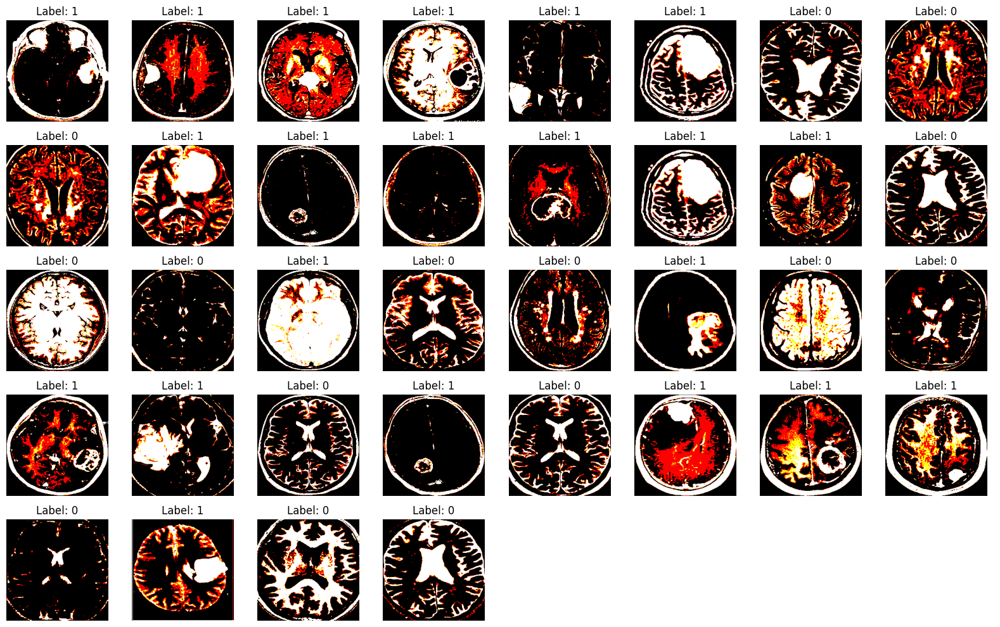

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Display images and labels from the validation set
num_images = len(X_val_prep)
num_cols = 8
num_rows = int(np.ceil(num_images / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 2*num_rows))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        image = np.squeeze(X_val_prep[i])  # Remove the channel dimension if present
        ax.imshow(image, cmap='gray')
        ax.set_title('Label: ' + str(y_val[i]))
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()


###### Data Preprocessing and Shuffling

In this section, we preprocess the images by resizing them to the desired target size and applying necessary preprocessing 


## Data Augmentation for Image Classification: Enhancing Training Dataset Diversity

This code demonstrates the implementation of data augmentation techniques to enhance the diversity and size of the training dataset for image classification tasks. Data augmentation is a crucial step in deep learning pipelines, as it helps to mitigate overfitting and improve the generalization capability of the model.

The code utilizes the `ImageDataGenerator` class from TensorFlow's Keras API to perform data augmentation. The following steps are performed:

1. Define the augmentation parameters: The code sets various parameters to control the transformations applied to the images. These include rotation range, width and height shift range, rescaling factor, shear range, brightness range, and horizontal and vertical flipping.

2. Prepare a sample image: A sample image from the training dataset is selected for augmentation. It is reshaped to match the expected input shape of the augmentation function.

3. Apply data augmentation: The `ImageDataGenerator` is used to generate augmented images based on the defined parameters. The `flow` function is called with the sample image and batch size to iterate over the augmented images.

4. Save augmented images: The augmented images are saved to a specified directory for preview and further analysis. Each augmented image is prefixed with 'aug_img' to distinguish it from the original images.

5. Visualize the results: The code displays the original image followed by a grid of some augmented images. The visualizations provide a glimpse into the diverse transformations applied during data augmentation.

Data augmentation plays a vital role in improving model performance by expanding the training dataset and introducing variability. It allows the model to learn from a broader range of scenarios, resulting in better generalization and increased robustness.

Feel free to adjust the title and description as needed to match your specific use case.


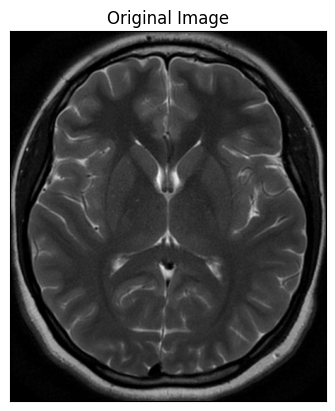

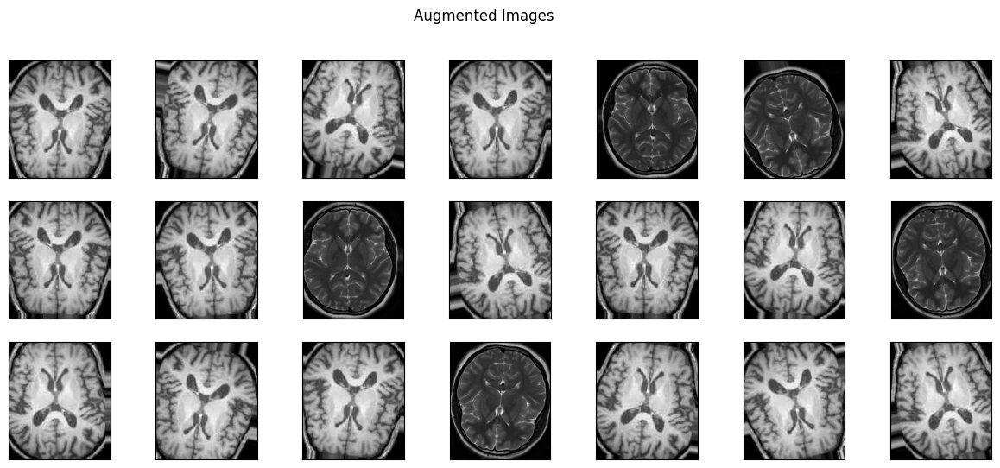

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2
import os

# Set the parameters for data augmentation
demo_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    rescale=1./255,
    shear_range=0.05,
    brightness_range=[0.1, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

# Choose an image from X_train_crop for demonstration
x = X_train_crop[1]
x = x.reshape((1,) + x.shape)

# Generate augmented images and save them to the 'preview' directory
save_dir = BASE_DIR + 'preview/'
os.makedirs(save_dir, exist_ok=True)

i = 0
for batch in demo_datagen.flow(x, batch_size=1, save_to_dir=save_dir, save_prefix='aug_img', save_format='jpg'):
    i += 1
    if i > 20:
        break

# Display the original image
plt.imshow(X_train_crop[0])
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

# Display a grid of some augmented images
plt.figure(figsize=(15, 6))
image_files = os.listdir(save_dir)
i = 1
for filename in image_files:
    img = cv2.imread(os.path.join(save_dir, filename))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3, 7, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    i += 1
    if i > 3 * 7:
        break

plt.suptitle('Augmented Images')
plt.show()


#### ImageDataGenerator for Data Augmentation and Image Preprocessing

This code demonstrates the usage of the `ImageDataGenerator` class from TensorFlow's Keras API for data augmentation and image preprocessing. The `ImageDataGenerator` provides a convenient way to apply transformations to the images in real-time during model training.

##### Data Augmentation

For the training dataset (`TRAIN_DIR`), the following data augmentation techniques are applied:

- Rotation range: 15 degrees
- Width shift range: 0.1 (fraction of total width)
- Height shift range: 0.1 (fraction of total height)
- Shear range: 0.1 (shear angle in counter-clockwise direction)
- Brightness range: Varies the brightness level between 0.5 and 1.5
- Horizontal flipping: Randomly flips images horizontally
- Vertical flipping: Randomly flips images vertically

##### Image Preprocessing

For both the training and validation datasets, the images are preprocessed using the `preprocess_input` function. This function applies the preprocessing steps specific to the VGG-16 model, which includes scaling the pixel values to a range suitable for the model's input.

##### Data Generators

The code sets up data generators for the training and validation datasets using the `flow_from_directory` function. The generators automatically load and preprocess images from the specified directories in batches. The important parameters used are:

- `color_mode`: The color mode of the loaded images (RGB).
- `target_size`: The size to which the images are resized.
- `batch_size`: The number of images per batch.
- `class_mode`: The type of labels to be generated (binary in this case).

The `train_generator` and `validation_generator` objects can be used to feed the augmented and preprocessed data into the model during the training and evaluation phases, respectively.

In [15]:
# Data Preparation and Augmentation

# Set the directories for the training and validation datasets
TRAIN_DIR = BASE_DIR + '/TRAIN_CROP/'
VAL_DIR = BASE_DIR + '/VAL_CROP/'

# Configure the data augmentation for the training dataset
train_datagen = ImageDataGenerator(
    rotation_range=15,                # Rotate the image by a random angle within the range of 0-15 degrees
    width_shift_range=0.1,            # Shift the width of the image by a random fraction within the range of 0-0.1
    height_shift_range=0.1,           # Shift the height of the image by a random fraction within the range of 0-0.1
    shear_range=0.1,                  # Apply shear transformation to the image within the range of 0-0.1
    brightness_range=[0.5, 1.5],      # Adjust the brightness of the image within the range of 0.5-1.5
    horizontal_flip=True,             # Perform horizontal flipping of the image
    vertical_flip=True,               # Perform vertical flipping of the image
    preprocessing_function=preprocess_input   # Apply preprocessing function to the image
)

# Configure the data preprocessing for the validation dataset
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input   # Apply preprocessing function to the image
)

# Create a data generator for the training dataset
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=1,
    class_mode='binary'
)

# Create a data generator for the validation dataset
validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=1,
    class_mode='binary'
)

# Get the total number of training samples
total_train_samples = train_generator.samples

# Print the total number of training samples
print("Total number of training samples:", total_train_samples)


Found 293 images belonging to 2 classes.
Found 36 images belonging to 2 classes.
Total number of training samples: 293


The purpose of the above code is to perform data augmentation on a set of images using the Keras `ImageDataGenerator`. Data augmentation is a technique commonly used in deep learning to artificially increase the size of a training dataset by applying various transformations to the existing images, resulting in additional variations of the data.

The code achieves the following goals:

1. Set the directories for the training and validation datasets (`TRAIN_DIR` and `VAL_DIR`).
2. Configure an `ImageDataGenerator` for training data with specified augmentation parameters such as rotation, shifting, shearing, brightness range, and flipping.
3. Configure an `ImageDataGenerator` for test/validation data, which applies preprocessing without augmentation.
4. Create a `train_generator` by using the `flow_from_directory` method of the `ImageDataGenerator` to load and augment images from the training directory. The images are resized to a target size (`IMG_SIZE`), and the labels are assigned based on the directory structure.
5. Create a `validation_generator` for the test/validation data using the same approach as the `train_generator`.
6. Retrieve the number of training samples from the `train_generator.samples`.
7. Print the total number of training samples.


# Model

Transfer learning is a powerful technique in machine learning that allows us to leverage knowledge acquired from solving one task and apply it to a different but related task. It is based on the idea that we don't need to start learning everything from scratch every time we encounter a new problem. Instead, we can transfer and adapt what we have already learned.

Unlike the traditional approach of building machine learning models, transfer learning involves using a pre-trained model as a starting point. The pre-trained model has been trained on a large dataset and has already learned useful features and patterns. By utilizing this pre-trained model, we can save time and computational resources.

In the context of deep learning, transfer learning has become particularly prominent. Deep neural networks, such as convolutional neural networks (CNNs), have achieved remarkable performance on various tasks like image classification, object detection, and natural language processing. These models can be trained on massive datasets, requiring significant computational resources and time.

Transfer learning allows us to take advantage of these pre-trained deep learning models. We can use the knowledge and representations learned by the models on large-scale datasets and apply them to our specific task, even if we have limited data. By fine-tuning the pre-trained model on our target task, we can adapt it to the specific nuances and patterns of our dataset.



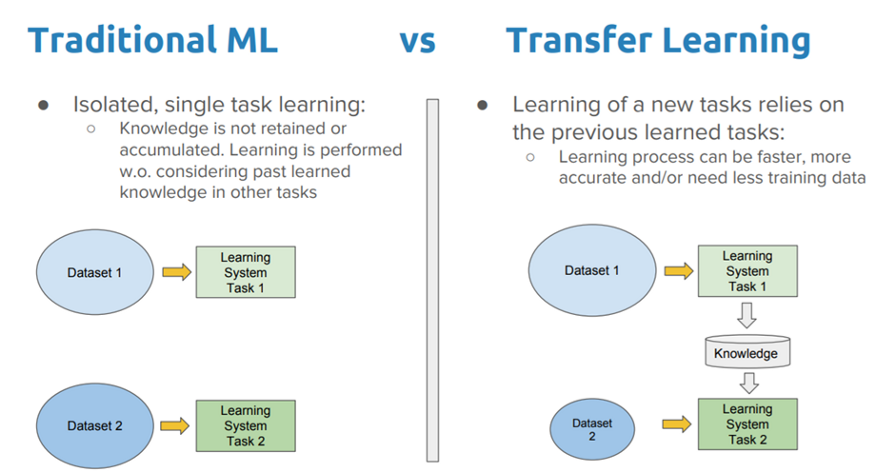

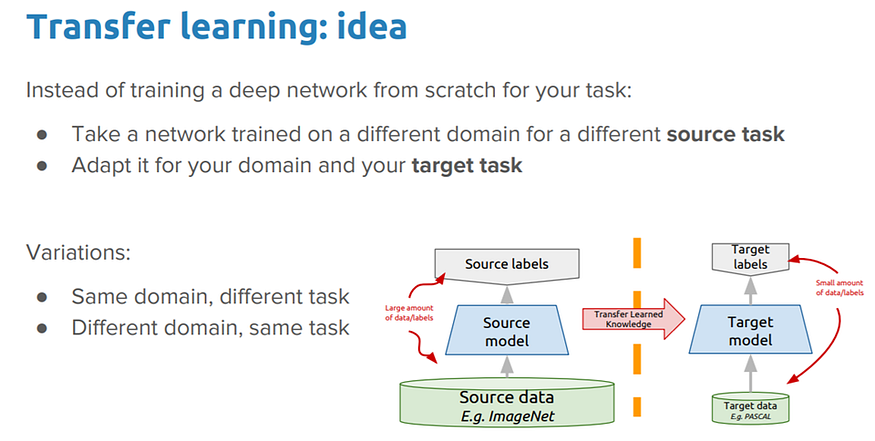

### VGG16 pre-trained CNN architecture. 

In the case of our brain tumor detection project, we are using the VGG16 pre-trained CNN architecture. VGG16 is a widely-used and well-known deep learning model that has been trained on the ImageNet dataset, which contains millions of labeled images from a thousand different classes. By starting with VGG16, we can benefit from its learned features and weights that capture general image patterns.

By applying transfer learning with VGG16, we aim to enhance the performance of our brain tumor detection model. We will fine-tune the last few layers of the VGG16 model on our specific brain tumor dataset, allowing the model to adapt its learned features to the task of detecting tumors. This approach can potentially improve the accuracy and efficiency of our model.

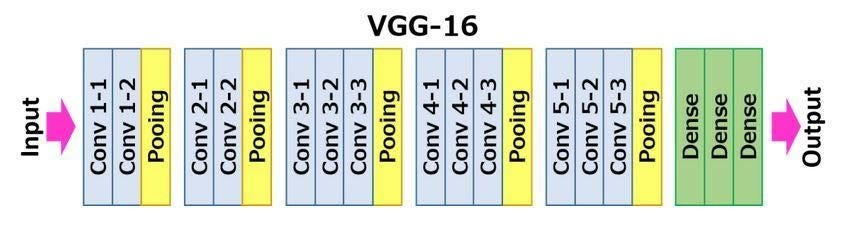

## Load base model 
### VGG16 pre-trained CNN architecture. 

In [16]:
from tensorflow.keras.applications.vgg16 import VGG16
# Load base model
vgg16_weight_path = r"vgg16_weights_pretrained.h5"
base_model = VGG16(
    weights=vgg16_weight_path,
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)


In [17]:
base_model.summary()


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

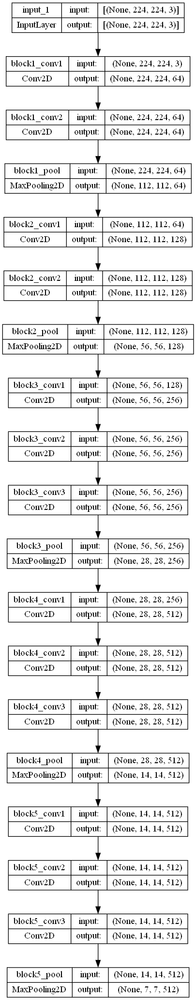

In [18]:
from tensorflow.keras.utils import plot_model

# Visualize the VGG16 model architecture
plot_model(base_model, to_file='vgg16_architecture.png', show_shapes=True)


## Creating Sequential Model with Pre-Trained VGG16

To create a sequential model and incorporate a pre-trained VGG16 model, follow these steps:
1. Initialize a sequential model.
2. Add a pre-trained VGG16 model as the first layer. This allows us to leverage the pre-trained weights and architecture of VGG16 for feature extraction.
3. Add a flatten layer to convert the output of the VGG16 model from a 3D tensor to a 1D vector.
4. Add a dropout layer with a dropout rate of 0.5 to prevent overfitting. This layer randomly drops out a fraction of the input units during training, improving the model's generalization.
5. Add a dense layer with 1 unit and a sigmoid activation function. This serves as the output layer, providing binary classification predictions.
6. Set the first layer (VGG16 model) as non-trainable to keep its pre-trained weights frozen during training.
7. Compile the model with the binary cross-entropy loss function, RMSprop optimizer with a learning rate of 1e-4, and accuracy as the evaluation metric.
8. Display the summary of the model, showcasing the layers, shapes, and number of parameters.

This approach allows us to build a customized model by incorporating the powerful feature extraction capabilities of the VGG16 model, leading to improved performance in brain tumor detection.


In [19]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

modeltumor = Sequential()
modeltumor.add(base_model)
modeltumor.add(layers.Flatten())
modeltumor.add(layers.Dropout(0.5))
modeltumor.add(layers.Dense(1, activation='sigmoid'))

modeltumor.layers[0].trainable = False

modeltumor.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)

modeltumor.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dropout (Dropout)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 1)                 25089     
                                                                 
Total params: 14,739,777
Trainable params: 25,089
Non-trainable params: 14,714,688
_________________________________________________________________


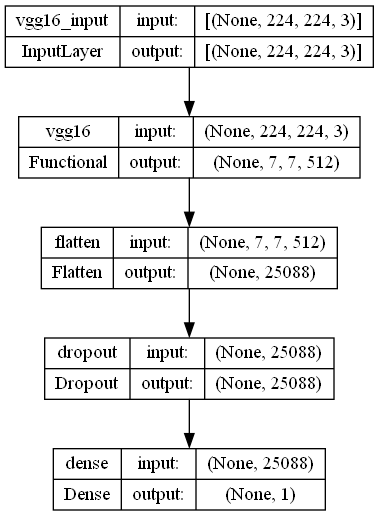

In [20]:
from tensorflow.keras.utils import plot_model

# Generate model visualization
plot_model(modeltumor, to_file='model_structure.png', show_shapes=True, show_layer_names=True)


## Model Architecture and Configuration

1. **Base Model (VGG16)**: The pre-trained VGG16 model is used as the base or feature extraction layer. It learns high-level features from input images.

2. **Flatten Layer**: This layer converts the multi-dimensional output from the base model into a 1D vector.

3. **Dropout Layer**: Dropout is applied to prevent overfitting. It randomly sets a fraction of input units to 0 during training.

4. **Dense Layer**: This fully connected layer performs classification based on the extracted features. It has a single neuron with a sigmoid activation function, producing a binary output for tumor presence.

To freeze the weights of the base model during training, `model.layers[0].trainable` is set to `False`. Only the weights of the newly added layers are updated.

The model is compiled with the following configuration:

- **Loss Function**: Binary Cross-Entropy. The formula for binary cross-entropy is calculated as:
    ```
    loss = - (y * log(p) + (1 - y) * log(1 - p))
    ```
    where `y` is the true label (0 or 1) and `p` is the predicted probability of the positive class (tumor presence).

- **Optimizer**: RMSprop. The RMSprop optimizer updates the model weights based on the gradients of the loss function. The update formula for RMSprop is:
    ```
    new_weight = old_weight - (learning_rate / sqrt(average_squared_gradient)) * gradient
    ```
    It adapts the learning rate by dividing the gradient by the root mean square of the exponentially weighted moving average of the squared gradients.

- **Metrics**: Accuracy. The accuracy metric is computed as follows:

  - **Training Accuracy**: Training accuracy is the proportion of correctly classified samples over the total number of training samples. The formula for training accuracy is:
    ```
    training_accuracy = (TP_train + TN_train) / (TP_train + TN_train + FP_train + FN_train)
    ```
    where TP_train is the number of true positive predictions on the training set, TN_train is the number of true negative predictions on the training set, FP_train is the number of false positive predictions on the training set, and FN_train is the number of false negative predictions on the training set.

  - **Testing Accuracy**: Testing accuracy is the proportion of correctly classified samples over the total number of testing samples. The formula for testing accuracy is:
    ```
    testing_accuracy = (TP_test + TN_test) / (TP_test + TN_test + FP_test + FN_test)
    ```
    where TP_test is the number of true positive predictions on the testing set, TN_test is the number of true negative predictions on the testing set, FP_test is the number of false positive predictions on the testing set, and FN_test is the number of false negative predictions on the testing set.

To get an overview of the model architecture and the number of trainable parameters, `model.summary()` is used.


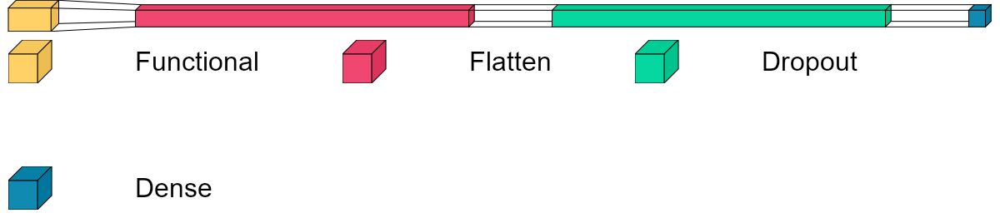

In [21]:
import visualkeras
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf", 32)

visualkeras.layered_view(modeltumor, legend=True, font=font, spacing=100)


In [23]:
import netron


# Save the model to a file in one of the supported formats
modeltumor.save('modeltumor.h5')

# Launch Netron to view the model
netron.start('modeltumor.h5')

Serving 'modeltumor.h5' at http://localhost:8080


('localhost', 8080)

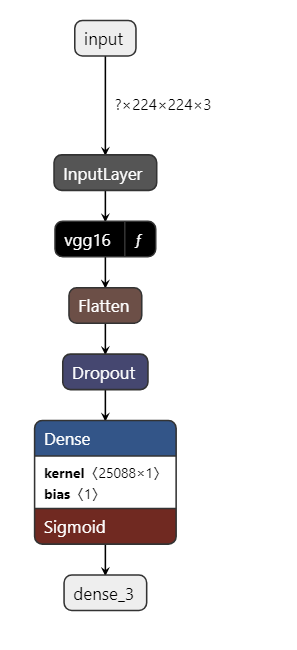

## Training

1. Set the number of epochs and define an early stopping callback to monitor validation accuracy.
2. Use the `fit_generator` function to train the model on the training data and validate it on the validation data.
3. Save the trained model in the "Trained Models" folder as 'brain_tumor_model.h5'.


In [33]:
from tensorflow.keras.callbacks import EarlyStopping
# Set the number of epochs and define early stopping
EPOCHS = 20
es = EarlyStopping(
    monitor='val_loss',
    mode='max',
    patience=6
)

In [34]:
# Train the model
history = modeltumor.fit_generator(
    train_generator,
    steps_per_epoch=200,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=36,
    callbacks=[es]
)


Epoch 1/12


C:\Users\Mifa\AppData\Local\Temp\ipykernel_17612\2828631412.py:2: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



200/200 [==============================] - 81s 404ms/step - loss: 5.2453 - accuracy: 0.8450 - val_loss: 2.6591 - val_accuracy: 0.8611
Epoch 2/12
200/200 [==============================] - 80s 400ms/step - loss: 3.4526 - accuracy: 0.8750 - val_loss: 2.1282 - val_accuracy: 0.8611
Epoch 3/12
200/200 [==============================] - 73s 365ms/step - loss: 5.8216 - accuracy: 0.8500 - val_loss: 0.2452 - val_accuracy: 0.9722
Epoch 4/12
200/200 [==============================] - 75s 376ms/step - loss: 4.4801 - accuracy: 0.8700 - val_loss: 1.2282 - val_accuracy: 0.9444
Epoch 5/12
200/200 [==============================] - 72s 362ms/step - loss: 3.9103 - accuracy: 0.8850 - val_loss: 2.3667 - val_accuracy: 0.9167
Epoch 6/12
200/200 [==============================] - 82s 412ms/step - loss: 3.8822 - accuracy: 0.8950 - val_loss: 1.9292 - val_accuracy: 0.9444
Epoch 7/12
200/200 [==============================] - 80s 402ms/step - loss: 3.3903 - accuracy: 0.9200 - val_loss: 2.1502 - val_accuracy: 0.9

In [37]:
# Save the trained model
modeltumor.save('Trained Models/brain_tumor_model.h5')

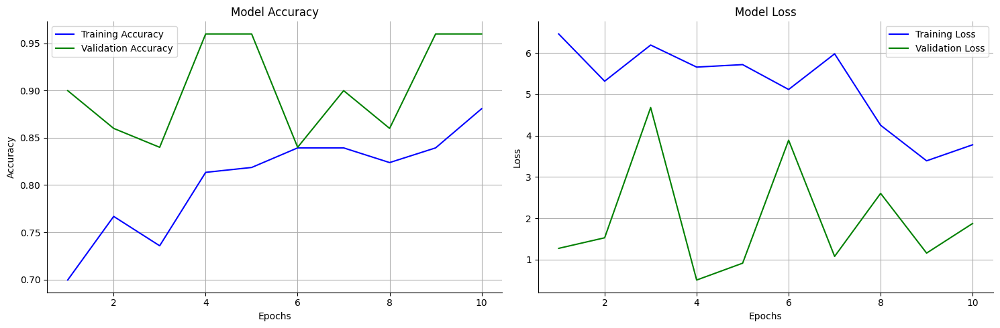

In [106]:
# Plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot accuracy
axes[0].plot(epochs_range, acc, label='Training Accuracy', color='blue')
axes[0].plot(epochs_range, val_acc, label='Validation Accuracy', color='green')
axes[0].legend(loc="best")
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Model Accuracy')
axes[0].grid(True)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Plot loss
axes[1].plot(epochs_range, loss, label='Training Loss', color='blue')
axes[1].plot(epochs_range, val_loss, label='Validation Loss', color='green')
axes[1].legend(loc="best")
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].set_title('Model Loss')
axes[1].grid(True)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


2/2 [==============================] - 13s 2s/step
Val Accuracy = 0.97


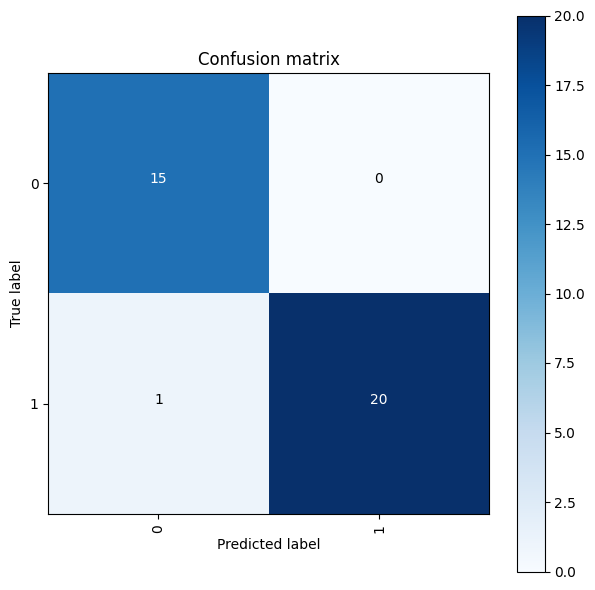

In [39]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()


# validate on val set
predictions = modeltumor.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

confusion_mtx = confusion_matrix(y_val, predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = [0,1], normalize=False)

2/2 [==============================] - 14s 2s/step
Test Accuracy = 0.95


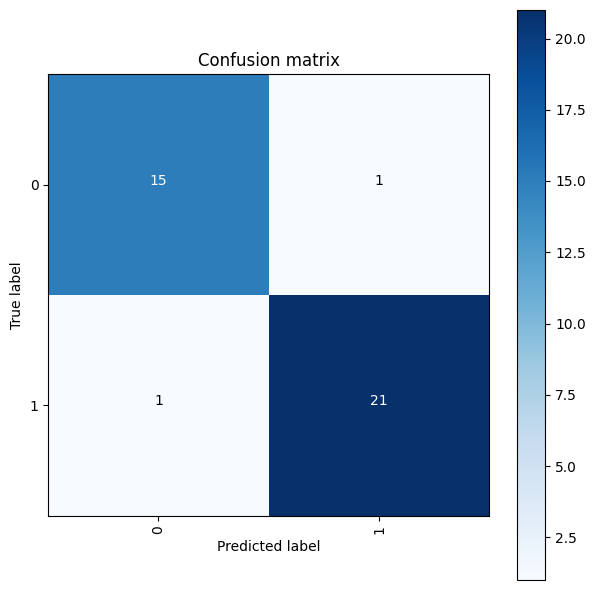

In [41]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()



# validate on test set
predictions = modeltumor.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

confusion_mtx = confusion_matrix(y_test, predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = [0,1], normalize=False)

2/2 [==============================] - 16s 7s/step
Val Accuracy = 0.47


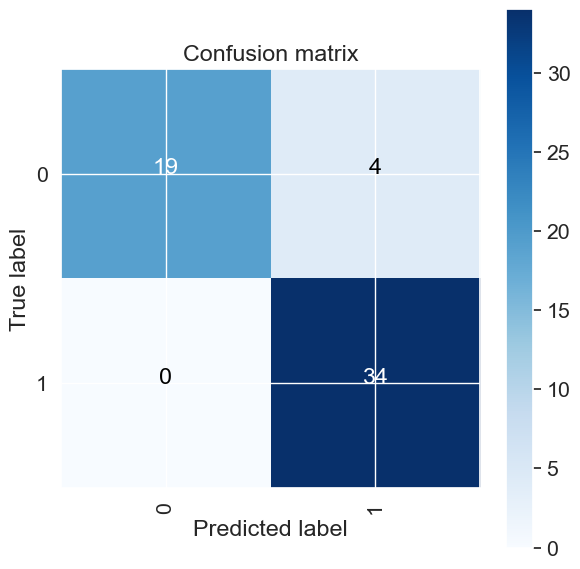

In [120]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()


# validate on val set
predictions = modeltumor.predict(X_val_preprocessed)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val_shuffled, predictions)
print('Val Accuracy = %.2f' % accuracy)

confusion_mtx = confusion_matrix(y_val, predictions) 
cm = plot_confusion_matrix(confusion_mtx, classes = [0,1], normalize=False)